In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import math
import re

In [8]:
df = pd.read_csv(".\dataset\Bengaluru_House_Data.csv")
df.head()

,area_type,availability,location,size,society,total_sqft,bath,balcony,price
0,Super built-up Area,19-Dec,Electronic City Phase II,2 BHK,Coomee,1056,2.0,1.0,39.07
1,Plot Area,Ready To Move,Chikka Tirupathi,4 Bedroom,Theanmp,2600,5.0,3.0,120.00
2,Built-up Area,Ready To Move,Uttarahalli,3 BHK,NaN,1440,2.0,3.0,62.00
3,Super built-up Area,Ready To Move,Lingadheeranahalli,3 BHK,Soiewre,1521,3.0,1.0,95.00
4,Super built-up Area,Ready To Move,Kothanur,2 BHK,NaN,1200,2.0,1.0,51.00


<AxesSubplot:>

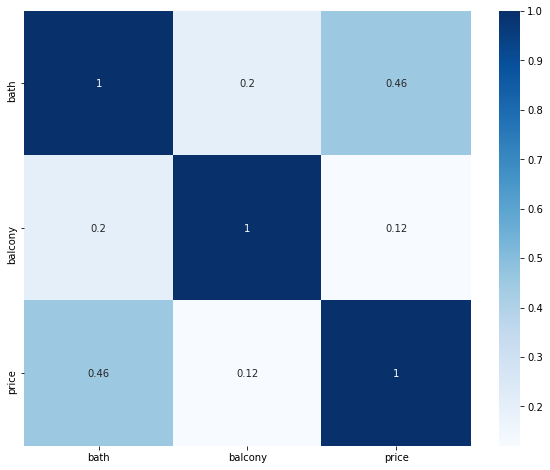

In [9]:
#finding correlation values within the dataset
#we remove features which are highly related to each other as they do not provide
#any significance value to our Model
corr = df.corr()
plt.figure(figsize = (10,8))
sns.heatmap(corr ,annot=True,cmap='Blues')

In [10]:
data = df.drop(columns=['area_type', 'availability','society','bath','balcony'])
data.head()

,location,size,total_sqft,price
0,Electronic City Phase II,2 BHK,1056,39.07
1,Chikka Tirupathi,4 Bedroom,2600,120.00
2,Uttarahalli,3 BHK,1440,62.00
3,Lingadheeranahalli,3 BHK,1521,95.00
4,Kothanur,2 BHK,1200,51.00


In [11]:
data.shape

(13320, 4)

location       1
size          16
total_sqft     0
price          0
dtype: int64


<AxesSubplot:>

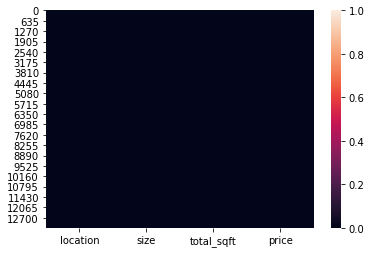

In [12]:
print(data.isnull().sum())
sns.heatmap(data.isnull())

In [13]:
# Handling Missing values
data['location'] = data['location'].fillna('Sarjapur  Road')
data['size'] = data['size'].fillna('3 BHK')

In [14]:
data.head()

,location,size,total_sqft,price
0,Electronic City Phase II,2 BHK,1056,39.07
1,Chikka Tirupathi,4 Bedroom,2600,120.00
2,Uttarahalli,3 BHK,1440,62.00
3,Lingadheeranahalli,3 BHK,1521,95.00
4,Kothanur,2 BHK,1200,51.00


In [15]:
# Removing outliers in 'SIZE'
data['size']=data['size'].replace('1 Bedroom','1')
data['size']=data['size'].replace('2 Bedroom','2')
data['size']=data['size'].replace('3 Bedroom','3')
data['size']=data['size'].replace('4 Bedroom','4')
data['size']=data['size'].replace('5 Bedroom','5')
data['size']=data['size'].replace('6 Bedroom','6')
data['size']=data['size'].replace('1 BHK','1')
data['size']=data['size'].replace('2 BHK','2')
data['size']=data['size'].replace('3 BHK','3')
data['size']=data['size'].replace('4 BHK','4')
data['size']=data['size'].replace('5 BHK','5')
data['size']=data['size'].replace('6 BHK','6')
data['size']=data['size'].replace([s for s in data['size'] if s not in ['1','2','3','4','5','6']],'3')
data['size'].value_counts()

2    5528
3    5155
4    1417
1     643
5     356
6     221
Name: size, dtype: int64

In [16]:
# Renaming the columns to correct names
data = data.rename(columns={'size':'BHK','total_sqft':'sqft'})
data.head()

,location,BHK,sqft,price
0,Electronic City Phase II,2,1056,39.07
1,Chikka Tirupathi,4,2600,120.00
2,Uttarahalli,3,1440,62.00
3,Lingadheeranahalli,3,1521,95.00
4,Kothanur,2,1200,51.00


In [17]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13320 entries, 0 to 13319
Data columns (total 4 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   location  13320 non-null  object 
 1   BHK       13320 non-null  object 
 2   sqft      13320 non-null  object 
 3   price     13320 non-null  float64
dtypes: float64(1), object(3)
memory usage: 416.4+ KB


In [18]:
# Changing the incorrect data type 
data['BHK']=data['BHK'].astype('category')
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13320 entries, 0 to 13319
Data columns (total 4 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   location  13320 non-null  object  
 1   BHK       13320 non-null  category
 2   sqft      13320 non-null  object  
 3   price     13320 non-null  float64 
dtypes: category(1), float64(1), object(2)
memory usage: 325.5+ KB


In [19]:
def convert_sqft_to_num(x):
    tokens = x.split('-')
    if len(tokens) == 2:
        return (float(tokens[0])+float(tokens[1]))/2
    try:
        return float(x)
    except:
        return None
## applying the fucntion to the column: - 'total_sqft'
data.sqft = data.sqft.apply(convert_sqft_to_num)
# Taking only the Numeric values from the data and storing it in 'home'
data = data[data.sqft.notnull()]
# display the first 2 columns from the dataset
data.head(2)

,location,BHK,sqft,price
0,Electronic City Phase II,2,1056.0,39.07
1,Chikka Tirupathi,4,2600.0,120.00


In [20]:
#checking the dataset with highest location data provided
#because havind values for a location less than 10 wont give us good information on the dataset
data.location = data.location.str.strip()
location_stats = data['location'].value_counts(ascending=False)
location_stats

Whitefield                                  539
Sarjapur  Road                              400
Electronic City                             304
Kanakpura Road                              271
Thanisandra                                 236
                                           ... 
West of Chord Road                            1
Soppahalli                                    1
Bennigana Halli                               1
Banashankari 3rd stage, Vivekanandanagar      1
Double Road                                   1
Name: location, Length: 1288, dtype: int64

In [21]:
#cretaing a Series of all the location having less than 10 entries against its  
location_stats_less_than_10 = location_stats[location_stats<=10]
location_stats_less_than_10

Nagadevanahalli                             10
Basapura                                    10
Kalkere                                     10
Naganathapura                               10
Dodsworth Layout                            10
                                            ..
West of Chord Road                           1
Soppahalli                                   1
Bennigana Halli                              1
Banashankari 3rd stage, Vivekanandanagar     1
Double Road                                  1
Name: location, Length: 1048, dtype: int64

In [22]:
#using lambda function to naming 'location_stats_less_than_10' as 'other' and then removing it
data.location = data.location.apply(lambda x: 'other' if x in location_stats_less_than_10 else x)
data = data[data.location != 'other']
data.shape

(10398, 4)

In [29]:
data['price_per_sqft'] = data['price']*100000/data['sqft']
data

,location,BHK,sqft,price,price_per_sqft
0,1st Block Jayanagar,4,2850.0,428.00,15017.543860
1,1st Block Jayanagar,3,1630.0,194.00,11901.840491
2,1st Block Jayanagar,6,1200.0,125.00,10416.666667
3,1st Block Jayanagar,3,1875.0,235.00,12533.333333
4,1st Block Jayanagar,3,930.0,85.00,9139.784946
...,...,...,...,...,...
8620,Yeshwanthpur,3,1676.0,92.13,5497.016706
8621,Yeshwanthpur,3,2503.0,138.00,5513.383939
8622,Yeshwanthpur,3,1855.0,135.00,7277.628032
8623,Yeshwanthpur,3,1876.0,160.00,8528.784648


In [30]:
data['price_per_sqft'].describe()

count     8625.000000
mean      5741.547053
std       2480.502632
min       1150.172117
25%       4250.000000
50%       5210.526316
75%       6500.000000
max      26973.684211
Name: price_per_sqft, dtype: float64

In [25]:

## as per Normal Distribution, 95% of our data lies within 1st Standard Deviation as per the location
def remove_pps_outliers(df):
    df_out = pd.DataFrame()
    for key, subdf in df.groupby('location'):
        m = np.mean(subdf.price_per_sqft)
        st = np.std(subdf.price_per_sqft)
        reduced_df = subdf[(subdf.price_per_sqft>(m-st)) & (subdf.price_per_sqft<=(m+st))]
        df_out = pd.concat([df_out,reduced_df],ignore_index=True)
    return df_out
data = remove_pps_outliers(data)
data.shape

(8625, 5)

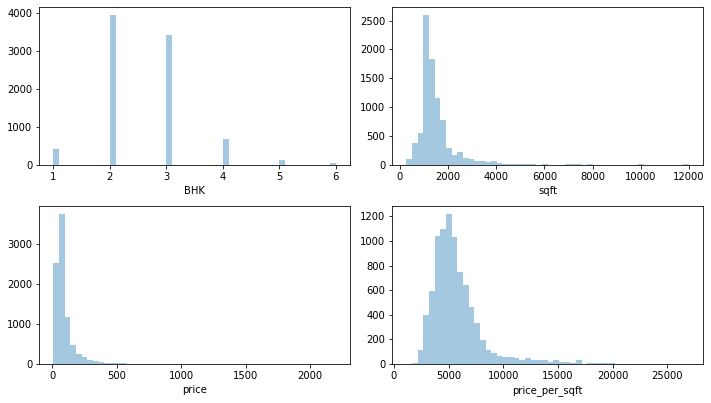

In [26]:
## representing Numerical Data and Visualizing the same usin Distplot to gain further info
num_ = data.select_dtypes(exclude = 'object')
fig = plt.figure(figsize =(10,8))
for index, col in enumerate(num_):
    plt.subplot(3,2,index+1)
    sns.distplot(num_.loc[:,col],kde = False)
fig.tight_layout(pad = 1.0)

<AxesSubplot:xlabel='BHK', ylabel='count'>

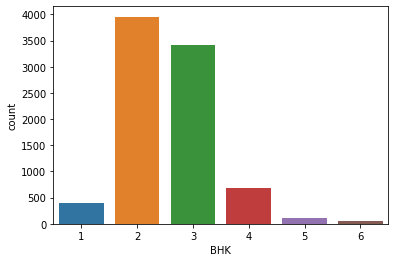

In [31]:
sns.countplot(x='BHK',data=data)

<AxesSubplot:xlabel='sqft', ylabel='Density'>

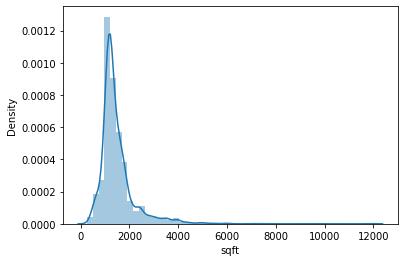

In [33]:
sns.distplot(data['sqft'],kde=True)

In [ ]:
sns.distplot(data['price_per_sqft'],kde=True)

<AxesSubplot:xlabel='BHK', ylabel='price'>

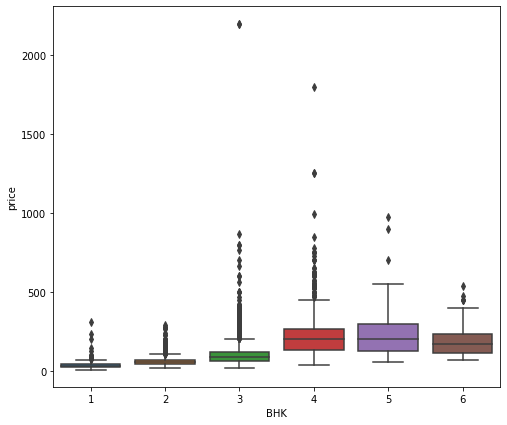

In [39]:
plt.subplots(figsize=(8,7))
sns.boxplot(x='BHK',y='price',data=data)

In [27]:
# To save dataframe to csv
# data.sort_values(by='location')
data = data.drop(columns=['price_per_sqft'])
data.reset_index(drop = True)
data.to_csv('Cleanned_data.csv', index=False)
data

,location,BHK,sqft,price
0,1st Block Jayanagar,4,2850.0,428.00
1,1st Block Jayanagar,3,1630.0,194.00
2,1st Block Jayanagar,6,1200.0,125.00
3,1st Block Jayanagar,3,1875.0,235.00
4,1st Block Jayanagar,3,930.0,85.00
...,...,...,...,...
8620,Yeshwanthpur,3,1676.0,92.13
8621,Yeshwanthpur,3,2503.0,138.00
8622,Yeshwanthpur,3,1855.0,135.00
8623,Yeshwanthpur,3,1876.0,160.00
